<a href="https://colab.research.google.com/github/katrin-ibrahim/UST/blob/main/FInal_copy_ESC50_ESC10_Master.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Mon Jun  6 11:21:37 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


#Download Dataset

In [1]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
base_dir = "/content/drive/MyDrive"
meta_dir = base_dir + '/ESC-50/ESC-50-master/meta'
audio_dir = base_dir + '/ESC-50/ESC-50-master/audio'
augmented_audio_dir = '/content/augmented_audio'
log_dir = base_dir + "/ESC-50/data/logs"
embeddings_dir = base_dir +'/ESC-50/data/embeddings'
saved_models_dir = base_dir + '/ESC-50/data/saved_models'

In [3]:
!mkdir /content/augmented_audio

In [4]:
!mkdir  /content/drive/MyDrive/ESC-50/data
!mkdir /content/drive/MyDrive/ESC-50/data/saved_models
!mkdir /content/drive/MyDrive/ESC-50/data/logs
!mkdir /content/drive/MyDrive/ESC-50/data/embeddings

mkdir: cannot create directory ‘/content/drive/MyDrive/ESC-50/data’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/ESC-50/data/saved_models’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/ESC-50/data/logs’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/ESC-50/data/embeddings’: File exists


In [ ]:
# Only run first time to download dataset
#!wget https://github.com/karolpiczak/ESC-50/archive/master.zip
#!unzip master.zip

In [ ]:
# Only run first time to copy dataset to drive
#!cp -r ./ESC-50-master /content/drive/MyDrive/ESC-50/

#Import Libraries

In [5]:
%%capture
!pip install autopool
!pip install audiomentations
!pip install soundfile

In [6]:
import os
from tqdm import tqdm

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Activation, GlobalAveragePooling2D, TimeDistributed, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import EfficientNetB5
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.utils import shuffle



import librosa, librosa.display
import IPython
import csv
import datetime

from autopool.keras import AutoPool1D
import soundfile as sf
from audiomentations import Compose, AddGaussianNoise, FrequencyMask, TimeStretch, PitchShift, Shift, AddBackgroundNoise

In [ ]:
print(tf.__version__)

2.8.0


#Variables

In [8]:
metadata = pd.read_csv('/content/drive/MyDrive/ESC-50/ESC-50-master/meta/esc50.csv')
metadata.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [9]:
srate = 44100 ###### 22050 --> 1104   32000 --> 800   44100*2206    BEST 44100 1024
n_fft = 1024
win_len = 1024
hop_len = 512

n_mels = 128
mono = True
# resample = 'kaiser_best'
# extraction = True #False

second = 2.5

In [27]:
epochs = 20
batch_size = 32
augmentations_arr = ['ps(-1)','ps(-2)'] 

#EDA


In [ ]:
metadata['category'].value_counts()

dog                 40
glass_breaking      40
drinking_sipping    40
rain                40
insects             40
laughing            40
hen                 40
engine              40
breathing           40
crying_baby         40
hand_saw            40
coughing            40
snoring             40
chirping_birds      40
toilet_flush        40
pig                 40
washing_machine     40
clock_tick          40
sneezing            40
rooster             40
sea_waves           40
siren               40
cat                 40
door_wood_creaks    40
helicopter          40
crackling_fire      40
car_horn            40
brushing_teeth      40
vacuum_cleaner      40
thunderstorm        40
door_wood_knock     40
can_opening         40
crow                40
clapping            40
fireworks           40
chainsaw            40
airplane            40
mouse_click         40
pouring_water       40
train               40
sheep               40
water_drops         40
church_bells        40
clock_alarm

In [ ]:
import glob 
drive_audio_path = glob.glob(base_dir + '/ESC-50/ESC-50-master/audio/*.wav', recursive=True)
print(f"Total Audio Files : {len(drive_audio_path)}")

Total Audio Files : 2000


In [19]:
def load_sample_by_index(index):
  sample_wav = metadata.filename[index]
  sample_path = base_dir + '/ESC-50/ESC-50-master/audio'
  sample_filename = os.path.join(sample_path, sample_wav) 
  y, sr = librosa.load(sample_filename,sr=srate)
  return y,sr,sample_filename


In [17]:
def plot_sample_wave(y,path):
  plt.plot(y)
  plt.title('Signal');
  plt.xlabel('Time (samples)');
  plt.ylabel('Amplitude');

In [21]:
def plot_sample_spec(y):
  mel_spect = librosa.feature.melspectrogram(y=y, sr=srate, n_fft=n_fft, hop_length=hop_len)
  mel_spect = librosa.power_to_db(mel_spect, ref=np.max)
  librosa.display.specshow(mel_spect, y_axis='mel', fmax=8000, x_axis='time');
  plt.title('Log-Mel Spectrogram');
  plt.colorbar(format='%+2.0f dB');

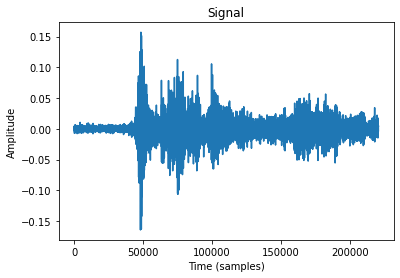

In [24]:
y,sr,path = load_sample_by_index(5)
plot_sample_wave(y,path)

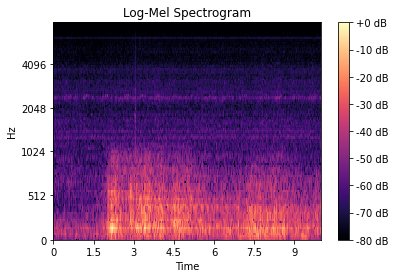

In [23]:
plot_sample_spec(y)

In [25]:
IPython.display.Audio(path)

##ESC-10 Metadata

In [ ]:
# If using esc10 
metadata = metadata.loc[metadata.esc10 == True]
metadata

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
14,1-110389-A-0.wav,1,0,dog,True,110389,A
24,1-116765-A-41.wav,1,41,chainsaw,True,116765,A
54,1-17150-A-12.wav,1,12,crackling_fire,True,17150,A
55,1-172649-A-40.wav,1,40,helicopter,True,172649,A
...,...,...,...,...,...,...,...
1876,5-233160-A-1.wav,5,1,rooster,True,233160,A
1888,5-234879-A-1.wav,5,1,rooster,True,234879,A
1889,5-234879-B-1.wav,5,1,rooster,True,234879,B
1894,5-235671-A-38.wav,5,38,clock_tick,True,235671,A


#Data Augmentation
> the augmented audio will be saved to whichever directory you specify above , if using persistant storage such as google drive , you only need to run this section once , then the following times only read the csv file from disk




In [29]:
def time_stretch(signal,sr,stretch_rate,sample_len):
  y = librosa.effects.time_stretch(signal, stretch_rate,)
  if len(y) > sample_len*sr:
    y = y[:sample_len*sr]
  elif len(y) < sample_len*sr:
    y = librosa.util.fix_length(y,sample_len*sr,mode='edge')
  return y


def pitch_shift(signal,sr,num_semitones):
  return librosa.effects.pitch_shift(signal,sr,num_semitones)

noise = Compose([
  AddGaussianNoise(min_amplitude=0.005, max_amplitude=0.15, p=1),
])
 

# bg_noise = Compose([
#                    AddBackgroundNoise('/content/bg_noise', 5 , 30 , 'relative' ,p=1)
# ])
 

In [ ]:
def augmentation_helper(aug_name,y,sr):
  if aug_name == "noise":
    aug_y = noise(y,sr)

  elif aug_name == "bg":
    aug_y = bg_noise(y,sr)
    
  elif aug_name == "ps(-1)":
    aug_y = pitch_shift(y,sr,-1)

  elif aug_name == "ps(-2)":
    aug_y = pitch_shift(y,sr,-2)



def apply_augmentation():
  count = 0
  for index,row in tqdm(metadata.iterrows()):
      if count%20 == 0:
        print(f"augmenting audio signal number : {count}/{len(metadata)}")
        
      file_name = os.path.join(audio_dir, str(row["filename"])) 
      y,sr = librosa.load(file_name)

      #loop over list of augmentations to apply them to all 
      for aug in augmentations_arr :
        aug_y = augmentation_helper(aug_name=aug, y=y, sr=sr)
        path = os.path.join(augmented_audio_dir,aug+"_"+ str(row["filename"]))

        if os.path.exists(path) == False:
          sf.write(path, aug_y , sr)
      count+=1




def get_metadata(meta_dir):
  csv_fields = ['filename', 'fold', 'target', 'category', 'src_file', 'take', 'augmented']
  count = 0
  dict_arr = []
  for index,row in tqdm(metadata.iterrows()):
    for aug in augmentations_arr :
      dict_arr.append({'filename':aug+"_"+row["filename"], 'fold':row["fold"], 'target': row["target"], 'category':row["category"], 'src_file': row["src_file"], 'take': row["take"]})
    dict_arr.append({'filename':row["filename"], 'fold':row["fold"], 'target': row["target"], 'category':row["category"], 'src_file': row["src_file"], 'take': row["take"]})


  with open(meta_dir, 'w') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames = csv_fields)
    writer.writeheader()
    writer.writerows(dict_arr)


  return (pd.read_csv(meta_dir))

In [ ]:
apply_augmentation()

##Augmented Metadata

In [ ]:
metadata_aug = get_metadata("aug.csv") 
len(metadata_aug)

400it [00:00, 6384.49it/s]


1200

#Feature Extraction
> the following will extract feature embeddings which will be saved to whichever directory you specify above 

In [ ]:
def feature_extractor(filename, srate=srate):

    if filename[0].isdigit() == True :
        file_name = os.path.join(audio_dir, filename)
    else :
        file_name = os.path.join(augmented_audio_dir, filename) 
  
    try:
        y, sr = librosa.load(file_name, sr=srate, mono=mono)
    except:
        raise IOError('Give me an audio  file which I can read!!')

    feature_data = []

    for i in range(2):
      i = i*int(srate*second)

      if i+ int(srate*second)>srate*10:
        break
    
      split_y = y[i : i + int(srate*second)]
      inpt = librosa.power_to_db(librosa.feature.melspectrogram(y=split_y, sr=srate, n_fft=n_fft, hop_length=hop_len, win_length=win_len, n_mels=n_mels))
      
      inpt = np.array(inpt)
      stack_inpt = np.stack(([inpt], [inpt], [inpt]), axis=3)
      feature = np.reshape(stack_inpt, (stack_inpt.shape[1], stack_inpt.shape[2], stack_inpt.shape[3]))
      feature_data.append(feature)
      
    feature_data = np.asarray(feature_data)
    return feature_data

In [ ]:
for index, row in tqdm(metadata_aug.iterrows()):
  
    filename = row["filename"]
    path = os.path.join(embeddings_dir,'baseline',filename+".npy")
   
    if os.path.exists(path) == False:
      feature = feature_extractor(filename)
      x = np.array(feature)
      np.save(os.path.join(embeddings_dir,filename),x)
      print(f"extraction file: {filename} in index: {index}/{len(metadata)}")
    else:
      print(f'already extracted features for sample in index: {index}')

#Data Split / Pre-proccessing


In [ ]:
def load_feature(filename):
  x = np.load(os.path.join(embeddings_dir,filename+".npy"))
  return x


def get_train_test_split(test_fold,use_augmented_data=True):
  if use_augmented_data == True :
    train_meta = metadata_aug.loc[metadata_aug.fold!=test_fold]
    test_meta = metadata.loc[metadata.fold==test_fold]
  else:
    train_meta = metadata.loc[metadata.fold!=test_fold]
    test_meta = metadata.loc[metadata.fold==test_fold]
  return train_meta, test_meta



def get_samples(meta):
  # samples = []
  x = []
  y = []
  i = 0
  for index, row in tqdm(meta.iterrows()):
    filename = row["filename"]
    label = row['category']
    # print(f"index:{i}")
    i+=1
    x.append(load_feature(filename))
    y.append(label)

    if(index%200 == 0) : 
      print(f"loading sample at index{index}")
  
  x = np.array(x)
  y = np.array(y)
  return x,y



def encode_labels(y):
    # Encoding labels (y)
    y_encoded = to_categorical(y)  
    return y_encoded

In [ ]:
len(metadata_aug)

8000

#Model 0 (TimeDistributed Model)


*   Reproduction of author's methodology



1.   EficcientNet-B1 base
2.   Dropout layer
3.   Dense layer with 50 neurons with l2 regularization
4. sigmoid activation function
5.AutoPool1D layer


>**within TimeDitributed wrapper , weights argument = imagenet






In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/ESC-50/ESC-50-master/logs/esc50

Reusing TensorBoard on port 6006 (pid 5007), started 0:00:47 ago. (Use '!kill 5007' to kill it.)

<IPython.core.display.Javascript object>

##Training

In [ ]:
batch_size = 32
epochs = 20
def train_model_no_gen(test_fold,name,epoch):

  base_td = tf.keras.applications.EfficientNetB1(include_top=False, pooling="avg",weights="imagenet" )

  input_td = layers.Input(shape=(2, 128, 216, 3), dtype='float32', name='input')
  x = TimeDistributed(base_td, name='Efficient-Net')(input_td)
  x = TimeDistributed(Dropout(0.5), name='Dropout')(x)
  x = TimeDistributed(Dense(10, activation='sigmoid', kernel_regularizer=l2(1e-4)), name='Dense')(x)
  x = AutoPool1D(axis=1, name='output')(x)
  m0 = tf.keras.Model(inputs=input_td, outputs=x)

  if test_fold == 1:
    m0.summary()
  print(f"model tested on fold {test_fold}")

  m0.compile(loss='categorical_crossentropy',
          optimizer=Adam(learning_rate=0.0001),
          metrics=["accuracy"])

  model_name = f"esc50_{name}_testfold{test_fold}_"+datetime.datetime.now().strftime("%Y:%m:%d-%H:%M:%S")
  save_path = os.path.join(saved_models_dir, f'fold{test_fold}_{name}.h5')
  logdir = os.path.join(log_dir,model_name)
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

  start = datetime.datetime.now()
  history_m0 = m0.fit(x_train,y_train, epochs=epoch,batch_size=batch_size,callbacks=[tensorboard_callback],validation_split=0.05)
  m0.save_weights(save_path)
  dur = datetime.datetime.now() - start
  print(f'model trained in {dur}')
 
  tf.keras.backend.clear_session()
  return m0
  # history_arr.append({"fold":i,"history":history_m0})
  # print_metrics(y_test, m0.predict(x_test))
  # print(y_test,m0.predict(x_test))

   

In [ ]:

for test_fold in range (1,6):
  train_meta,test_meta = get_train_test_split(test_fold,use_augmented_data=True)
  x_train,y_train = get_samples(train_meta)
  x_test, y_test = get_samples(test_meta)
  le = LabelEncoder()
  y_test = to_categorical(le.fit_transform(y_test))
  y_train = to_categorical(le.fit_transform(y_train))
  m0 = train_model_no_gen(test_fold,f"c2")
  print(f'score{m0.evaluate(x_test,y_test)}')

#Model Evaluate

In [ ]:
def get_average_val_acc():
  sum = 0
  for i in range (len(history_arr)):
    sum+=history_arr[i]["history"].history['val_accuracy'][-1]
  return sum/5

In [ ]:
get_average_val_acc()

0.837499988079071